<H1>CAPSTONE PROJECT</H1>

This notebook will be used for the Capstone Project

The purpose of this notebook is to explore the most popular venues in the neighbourhoods of Cluj-Napoca and see if there is any correlation to population density and housing prices.  

As a first step, the libraries and environments needed for the data analysis will be imported.

In [8]:
import pandas as pd
import numpy as np

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

mpl.style.use('ggplot') # optional: for ggplot-like style

# check for latest version of Matplotlib
print ('Matplotlib version: ', mpl.__version__) # >= 2.0.0

Matplotlib version:  3.0.2


In [9]:
import json # library to handle JSON files

!conda install -c conda-forge geopy --yes
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes
import folium # map rendering library

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    geopy-1.20.0               |             py_0          57 KB  conda-forge
    openssl-1.1.1c             |       h516909a_0         2.1 MB  conda-forge
    certifi-2019.9.11          |           py36_0         147 KB  conda-forge
    ca-certificates-2019.9.11  |       hecc5488_0         144 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         2.5 MB

The following NEW packages will be INSTALLED:

    geographiclib:   1.50-py_0         conda-forge
    geopy:           1.20.0-py_0       conda-forge

The following packages will be UPDATED:

    ca-

<H2> Data Exploration </H2>

Let's import the data and see how it looks.

In [11]:
raw_data = "http://nopurpose.ca/wp-content/uploads/2019/10/Cluj_Data_simplified.csv"
df=pd.read_csv(raw_data)
df.head()

,Neighbourhood,Population Density,Latitude,Longitude,Growth_Land,Growth_House,Growth_Condo,Growth_Other,Growth_Total,Growth_Price_Land,...,Price_Fin_Total_2017,Per_Fin_Alone_2017,Per_Fin_Bank_2017,Price_Fin_Alone_2018,Price_Fin_Bank_2018,Price_Fin_Total_2018,Per_Fin_Alone_2018,Per_Fin_Bank_2018,Average_Price_2018,Average_Price_2017
0,Andrei Muresanu,6990.0,46.76184,23.60956,-0.60,-0.06,0.04,-0.20,3.49,-0.88,...,34783331,0.77,0.23,25047743,7408295,32456038,0.77,0.23,81140,83015
1,Becas,286.0,46.75322,23.60972,-0.09,1.00,4.00,4.00,23.67,-0.51,...,2910085,0.74,0.26,4265549,2114911,6380460,0.67,0.33,86222,103932
2,Borhanci,1515.0,46.75481,23.62817,-0.52,0.52,0.04,-0.41,3.10,-0.70,...,26076748,0.73,0.27,19696341,9103400,28799741,0.68,0.32,80672,65519
3,Bulgaria,2907.0,46.78892,23.61849,-1.00,0.17,-0.75,-0.58,-0.08,-1.00,...,5800044,0.78,0.22,1907214,703304,2610518,0.73,0.27,47464,41135
4,Buna Ziua,4116.0,46.74981,23.59846,-1.00,0.30,0.42,0.52,5.19,-1.00,...,39419870,0.68,0.32,40284095,17885341,58169436,0.69,0.31,70680,67269


In [12]:
df.shape

(20, 27)

In [13]:
df.dtypes

Neighbourhood            object
Population Density      float64
Latitude                float64
Longitude               float64
Growth_Land             float64
Growth_House            float64
Growth_Condo            float64
Growth_Other            float64
Growth_Total            float64
Growth_Price_Land       float64
Growth_Price_House      float64
Growth_Price_Condo      float64
Growth_Price_Other      float64
Growth_Price_Total      float64
Growth_Average_Price    float64
Price_Fin_Alone_2017      int64
Price_Fin_Bank_2017       int64
Price_Fin_Total_2017      int64
Per_Fin_Alone_2017      float64
Per_Fin_Bank_2017       float64
Price_Fin_Alone_2018      int64
Price_Fin_Bank_2018       int64
Price_Fin_Total_2018      int64
Per_Fin_Alone_2018      float64
Per_Fin_Bank_2018       float64
Average_Price_2018        int64
Average_Price_2017        int64
dtype: object

All variables are in numeric format, thus there is no need for type conversion.

Now let's do some exploratory analysis.

This is how the <b>density of the population</b> looks like for Cluj:

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


Text(0.5, 0, 'Density')

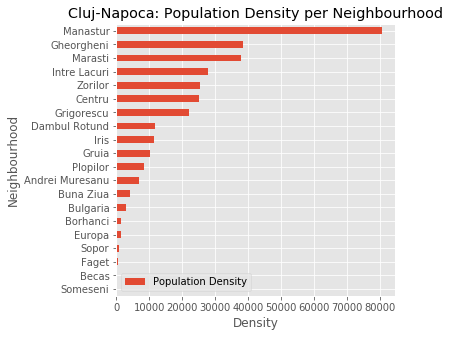

In [14]:
density=df[['Neighbourhood','Population Density']]
density.set_index('Neighbourhood', inplace=True)
density.sort_values(['Population Density'],ascending=True, axis=0,inplace=True)

density.plot(kind='barh', figsize=(5,5))

plt.title("Cluj-Napoca: Population Density per Neighbourhood")
plt.ylabel("Neighbourhood")
plt.xlabel("Density")

Assuming that the total EURs spent on real estate transaction is a fair representation of <b>growth and investment</b> in a particular neighbourhood, please see below how Cluj looks like.

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


Text(0.5, 0, 'Real Estate transactions')

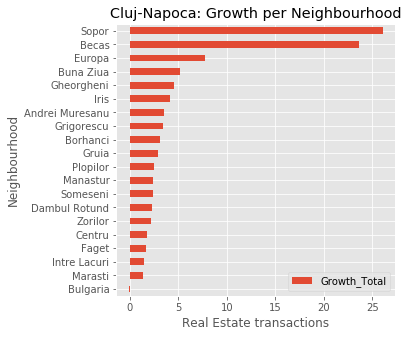

In [15]:
growth=df[['Neighbourhood','Growth_Total']]
growth.set_index('Neighbourhood', inplace=True)
growth.sort_values(['Growth_Total'],ascending=True, axis=0,inplace=True)

growth.plot(kind='barh', figsize=(5,5))

plt.title("Cluj-Napoca: Growth per Neighbourhood")
plt.ylabel("Neighbourhood")
plt.xlabel("Real Estate transactions")

Assuming that the higher the prices and the higher the real estate acquisitions paid with cash are a fair representation of the <b>wealth in a specific neighbourhood</b>, let's see how Cluj looked like in 2017 and 2018.

In [16]:
#PREPARING DATA:

#2017:
#Total real estate transactin financed by cash
self_fin_2017=df[['Neighbourhood','Per_Fin_Alone_2017']]
self_fin_2017.set_index('Neighbourhood', inplace=True)
self_fin_2017.sort_values(['Per_Fin_Alone_2017'],ascending=True, axis=0,inplace=True)

#Average price
avg_price_2017=df[['Neighbourhood','Average_Price_2017']]
avg_price_2017.set_index('Neighbourhood', inplace=True)
avg_price_2017.sort_values(['Average_Price_2017'],ascending=True, axis=0,inplace=True)


#2018:
#Total real estate transactin financed by cash
self_fin_2018=df[['Neighbourhood','Per_Fin_Alone_2018']]
self_fin_2018.set_index('Neighbourhood', inplace=True)
self_fin_2018.sort_values(['Per_Fin_Alone_2018'],ascending=True, axis=0,inplace=True)

#Average price
avg_price_2018=df[['Neighbourhood','Average_Price_2018']]
avg_price_2018.set_index('Neighbourhood', inplace=True)
avg_price_2018.sort_values(['Average_Price_2018'],ascending=True, axis=0,inplace=True)

/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/opt/conda/envs/Python36/lib/python3.6/site-packages/ipykernel/__main__.py:24: SettingWithCopyWarning: 
A value is trying 

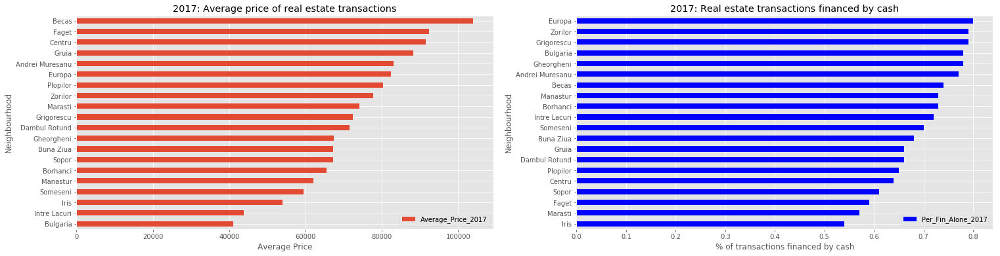

In [35]:
#Preparind subplots for 2017
fig = plt.figure() # create figure

ax0 = fig.add_subplot(1, 2, 1) # add subplot 1 (1 row, 2 columns, first plot)
ax1 = fig.add_subplot(1, 2, 2) # add subplot 2 (1 row, 2 columns, second plot) 

# Subplot 1:
avg_price_2017.plot(kind='barh', figsize=(25, 6), ax=ax0)
ax0.set_title('2017: Average price of real estate transactions')
ax0.set_xlabel('Average Price')

# Subplot 2: 
self_fin_2017.plot(kind='barh', color='blue', figsize=(25, 6), ax=ax1)
ax1.set_title('2017: Real estate transactions financed by cash')
ax1.set_xlabel('% of transactions financed by cash')

plt.show()

Based on the above, the <b>top 5 wealthiest neighbourhoods</b> based on average price and % of transactions financed by cash <b>in 2017</b> are:
    Andrei Muresanu, Becas, Europa, Grigorescu and Zorilor.

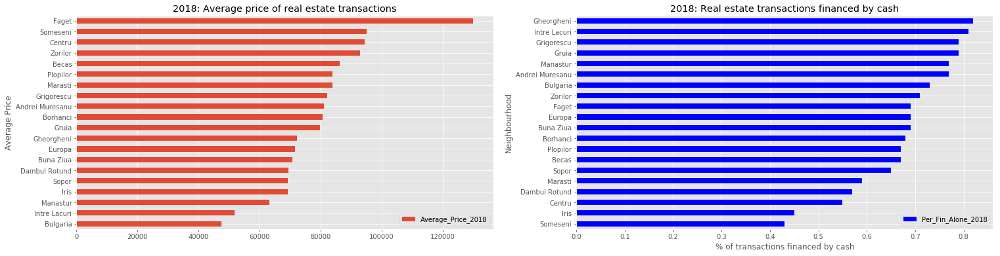

In [17]:
#Preparind subplots for 2018
fig_1 = plt.figure() # create figure

ax0 = fig_1.add_subplot(1, 2, 1) # add subplot 1 (1 row, 2 columns, first plot)
ax1 = fig_1.add_subplot(1, 2, 2) # add subplot 2 (1 row, 2 columns, second plot) 

# Subplot 1:
avg_price_2018.plot(kind='barh', figsize=(25, 6), ax=ax0)
ax0.set_title ('2018: Average price of real estate transactions')
ax0.set_ylabel('Average Price')

# Subplot 2: 
self_fin_2018.plot(kind='barh', color='blue', figsize=(25, 6), ax=ax1)
ax1.set_title('2018: Real estate transactions financed by cash')
ax1.set_xlabel('% of transactions financed by cash')

plt.show()

Based on the above, the <b>top 5 wealthiest neighbourhoods</b> based on average price and % of transactions financed by cash <b>in 2018</b> are:
    Andrei Muresanu, Faget, Grigorescu and Zorilor.

Based on the above analysis of the 2017 and 2018 data, we could see that:
- the top wealthiest neighbourhoods are: Andrei Muresanu, Becas, Europa, Faget, Grigorescu, Zorilor.
- the fastest growing neighbourhoods are: Sopor, Becas, Europa, Buna Ziua, Gheorgheni.
- the most dense neighbourhoods are: Manastur, Gherogheni, Marasti, Intre Lacuri, Zorilor.

All the above could be good candidates for opening health and fitness centers for different reasons. The wealthiest could yield high returns, the fastest growing could give a competitive advantage and higher returns based on growing population, while the most dense could give high return based on high demand. 

Having a brief overview of the potential demand, we will further investigate the supply side using Foursquare. 

<H2> Foursquare Analysis </H2>

Creating the connection with Foursquare:

In [18]:
CLIENT_ID = 'TFE31JBELQWHLJSX5MZTCRPLO2V13XID32IJFAZM03KXUHAG' # your Foursquare ID
CLIENT_SECRET = '5MSLRWWN5FBGL2BNFN2L1T5SE4JYAJOTKB1XSRL05SIO040L' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

Create the dataframe for the neighbourhoods in Cluj

In [19]:
cluj_data = df[['Neighbourhood','Latitude','Longitude']]
cluj_data.head()

,Neighbourhood,Latitude,Longitude
0,Andrei Muresanu,46.76184,23.60956
1,Becas,46.75322,23.60972
2,Borhanci,46.75481,23.62817
3,Bulgaria,46.78892,23.61849
4,Buna Ziua,46.74981,23.59846


Getting the geographical coordinates of Cluj

In [20]:
address = 'Cluj-Napoca'

geolocator = Nominatim(user_agent="cj_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Cluj-Napoca are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Cluj-Napoca are 46.769379, 23.5899542.


Create map of Cluj using latitude and longitude values

In [21]:
map_cj = folium.Map(location=[latitude, longitude], zoom_start=12)

# add markers to map
for lat, lng, label in zip(cluj_data['Latitude'], cluj_data['Longitude'], cluj_data['Neighbourhood']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_cj)  
    
map_cj

Create cloropleth map of Cluj to see population density per neighbourhood.

In [22]:
#define dataframe for cloropleth map
pop_density=df[['Neighbourhood','Population Density']]
pop_density.head()

,Neighbourhood,Population Density
0,Andrei Muresanu,6990.0
1,Becas,286.0
2,Borhanci,1515.0
3,Bulgaria,2907.0
4,Buna Ziua,4116.0


In [23]:
# download Cluj_Napoca geojson file
!wget --quiet http://www.geo-spatial.org/file_download/29543 -O cj.json
    
cj_geo = r'cj.json' # geojson file

In [24]:
cj_map = folium.Map(location = [latitude, longitude], zoom_start = 12)

cj_map.choropleth(
    geo_data=cj_geo,
    data=pop_density,
    columns=['Neighbourhood', 'Population Density'],
    key_on='feature.properties.localitate',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name="Cluj: Population Density"
)

cj_map

Create a function to explore the venues in the neighborhoods of Cluj

In [26]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            limit)
         # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighbourhood', 
                  'Neighbourhood Latitude', 
                  'Neighbourhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Run the above function to get the venues for Cluj.

In [27]:
limit=1000
cj_venues = getNearbyVenues(names=cluj_data['Neighbourhood'], latitudes=cluj_data['Latitude'], longitudes=cluj_data['Longitude'])

Andrei Muresanu
Becas
Borhanci
Bulgaria
Buna Ziua
Centru
Dambul Rotund
Europa
Faget
Intre Lacuri
Gheorgheni
Grigorescu
Gruia
Iris
Manastur
Marasti
Plopilor
Someseni
Sopor
Zorilor


Let's see a summary of the venues' data.

In [33]:
print(cj_venues.shape)
cj_venues

(381, 7)


,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Andrei Muresanu,46.76184,23.60956,BasTattoo,46.762111,23.610541,Art Gallery
1,Andrei Muresanu,46.76184,23.60956,Engels Bistro,46.761814,23.605757,Bistro
2,Andrei Muresanu,46.76184,23.60956,Panemar,46.762752,23.613524,Bakery
3,Andrei Muresanu,46.76184,23.60956,Parcul Engels,46.761749,23.606138,Park
4,Andrei Muresanu,46.76184,23.60956,Il Caffe' dell' angolo,46.763630,23.608081,Café
5,Andrei Muresanu,46.76184,23.60956,Engels Bistro,46.761833,23.605682,Restaurant
6,Andrei Muresanu,46.76184,23.60956,Restaurant Hora,46.761851,23.606917,Restaurant
7,Andrei Muresanu,46.76184,23.60956,Pizzeria Venezia,46.762820,23.609813,Pizza Place
8,Andrei Muresanu,46.76184,23.60956,Hanul Dacilor,46.763401,23.608582,Romanian Restaurant
9,Andrei Muresanu,46.76184,23.60956,Restaurant Hermes,46.762947,23.613869,Restaurant


Now the venues per neighbourhood.

In [29]:
cj_total_venues=cj_venues.groupby('Neighbourhood').count()
cj_total_venues.head()

,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighbourhood,,,,,,
Andrei Muresanu,17,17,17,17,17,17
Becas,9,9,9,9,9,9
Borhanci,4,4,4,4,4,4
Bulgaria,4,4,4,4,4,4
Buna Ziua,5,5,5,5,5,5


From the above we can conclude that the venues containing the word 'gym' in the Venue Category column are the current health & fitness centers in Cluj.
Further we will investigate how they map on the previously identified neighbourhoods as being a good place for investment.

First, let's create a dataframe only with the venue category containing the word 'gym'.

In [39]:
fitness=cj_venues[cj_venues['Venue Category'].str.contains("Gym")]

fitness

,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
29,Borhanci,46.75481,23.62817,TCI Social Club,46.751694,23.632021,Gym / Fitness Center
60,Centru,46.77004,23.59060,Lady's Gym,46.771668,23.589618,Gym
163,Europa,46.76642,23.58795,Olympus Wellness Center,46.764560,23.585158,Gym
231,Intre Lacuri,46.77636,23.62566,World Class,46.773126,23.628083,Gym / Fitness Center
276,Gheorgheni,46.76635,23.61682,Gimmy,46.770340,23.618686,Gym / Fitness Center
277,Gheorgheni,46.76635,23.61682,Energy Fitness,46.769496,23.618480,Gym / Fitness Center
284,Gheorgheni,46.76635,23.61682,YourGym,46.767231,23.617693,Gym
292,Grigorescu,46.76804,23.55354,Fit For Life,46.767215,23.549378,Gym
306,Gruia,46.77715,23.57683,World Class,46.774537,23.581505,Gym / Fitness Center
311,Gruia,46.77715,23.57683,Granata Gym,46.780195,23.578322,Gym


Now that we identified all the health and fitness centers in Cluj, let's group them by neighbourhood.

Text(0.5, 0, '# fitness centers')

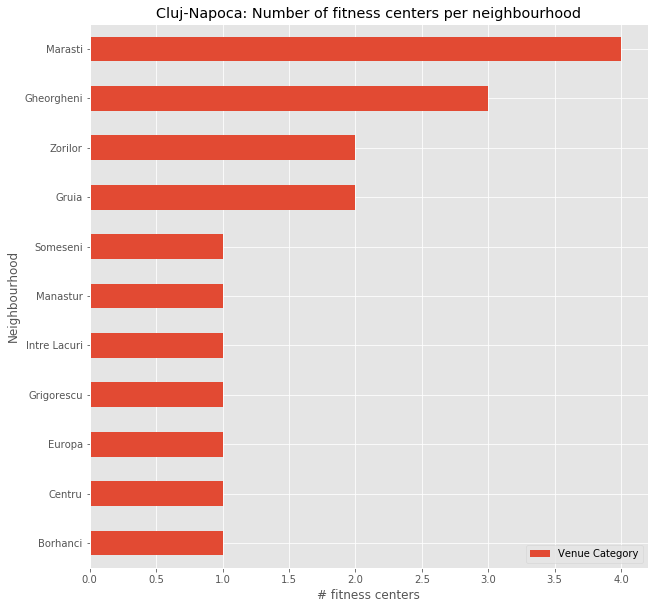

In [52]:
gym=fitness[['Neighbourhood','Venue Category']]

gym_1=gym.groupby('Neighbourhood').count()
gym_1.sort_values(['Venue Category'],ascending=True, axis=0,inplace=True)
gym_1.plot(kind='barh',figsize=(10,10))

plt.title("Cluj-Napoca: Number of fitness centers per neighbourhood")
plt.ylabel("Neighbourhood")
plt.xlabel("# fitness centers")

This is how the fitness centers looks on the map of Cluj.

In [55]:
centers=fitness[['Venue Category','Venue Latitude','Venue Longitude']]

map_centers = folium.Map(location=[latitude, longitude], zoom_start=12)

# add markers to map
for lat, lng, label in zip(centers['Venue Latitude'], centers['Venue Longitude'], centers['Venue Category']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='green',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_centers)  
    
map_centers

<H2>Summary</H2>

To summarize, the following neighbourhoods were identified as potentials for investment based on their population density, growth and wealth.

In [69]:
data = [['Andrei Muresanu'], ['Becas'], ['Europa'],['Faget'],['Grigorescu'],['Zorilor'],['Sopor'],['Buna Ziua'],['Gheorgheni'],['Manastur'],['Marasti'],['Intre Lacuri']]
demand= pd.DataFrame(data, columns = ['Neighbourhood']) 
demand.set_index("Neighbourhood",inplace=True)
demand

""
Neighbourhood
Andrei Muresanu
Becas
Europa
Faget
Grigorescu
Zorilor
Sopor
Buna Ziua
Gheorgheni


To have a better understanding of whether there is potential for investment, let's bring in the population density, growth and wealth information, as well as the number of fitness centers currently available.

In [84]:
supply=pd.merge(left=demand,right=gym_1,how='left',left_on='Neighbourhood', right_on='Neighbourhood').reset_index()
supply.set_index("Neighbourhood",inplace=True)

supply_1=pd.merge(supply,density,on='Neighbourhood').reset_index()
supply_1.set_index("Neighbourhood",inplace=True)

supply_2=pd.merge(supply_1,growth,on='Neighbourhood').reset_index()
supply_2.set_index("Neighbourhood",inplace=True)

supply_3=pd.merge(supply_2,avg_price_2017,on='Neighbourhood').reset_index()
supply_3.set_index("Neighbourhood",inplace=True)

supply_4=pd.merge(supply_3,self_fin_2017,on='Neighbourhood').reset_index()
supply_4.set_index("Neighbourhood",inplace=True)

supply_5=pd.merge(supply_4,avg_price_2018,on='Neighbourhood').reset_index()
supply_5.set_index("Neighbourhood",inplace=True)

supply_6=pd.merge(supply_5,self_fin_2018,on='Neighbourhood').reset_index()
supply_6.set_index("Neighbourhood",inplace=True)
supply_6.sort_values(['Venue Category'],ascending=False, axis=0,inplace=True)

supply_6

,Venue Category,Population Density,Growth_Total,Average_Price_2017,Per_Fin_Alone_2017,Average_Price_2018,Per_Fin_Alone_2018
Neighbourhood,,,,,,,
Marasti,4.0,37897.0,1.34,74022,0.57,83825,0.59
Gheorgheni,3.0,38311.0,4.55,67396,0.78,72338,0.82
Zorilor,2.0,25328.0,2.19,77657,0.79,93004,0.71
Europa,1.0,1319.0,7.73,82347,0.80,71596,0.69
Grigorescu,1.0,22114.0,3.42,72311,0.79,82045,0.79
Manastur,1.0,80731.0,2.43,62049,0.73,63200,0.77
Intre Lacuri,1.0,27766.0,1.50,43836,0.72,51742,0.81
Andrei Muresanu,NaN,6990.0,3.49,83015,0.77,81140,0.77
Becas,NaN,286.0,23.67,103932,0.74,86222,0.67


<b>In conclusion, all the idenfitied neighbourhoods are good candidates for investments into health & fitness centers.</b>

As it can be seen above:
- Becas and Sopor have no centers even though they had a significant growth in the past two years. 
- Faget, Buna Ziua, Andrei Muresanu have no centes and Europa has only one even though they seem to be wealthy neighbourhoods. 
- Marasti, Gheorgheni, Zorilor, Grigorescu, Manastur and Intre Lacuri have few centers for the population density they contain.
